### Task 4: Location-Based Analysis

In this task, we will perform a comprehensive geographical analysis of the restaurants in our dataset. The primary objective is to explore the spatial distribution of restaurants based on their latitude and longitude coordinates, providing insights into their geographical concentration and characteristics.

We will begin by visualizing the distribution of restaurants on a map, allowing us to identify patterns and clusters within various regions. Next, we will group the restaurants by city or locality to analyze the concentration of dining establishments across different areas.

Additionally, we will calculate key statistics, such as average ratings, types of cuisines, and price ranges, segmented by city or locality. This analysis aims to reveal interesting insights and trends related to the locations of the restaurants, ultimately enhancing our understanding of the culinary landscape within the dataset.

By the end of this task, we hope to uncover significant patterns that could inform future decisions related to restaurant operations, market opportunities, and consumer preferences in different geographical areas.


### Step 1: Load and Display the Dataset

In this step, we will load the dataset containing information about various restaurants, including their geographical coordinates, ratings, cuisines, and more. We will use Pandas to read the dataset and display the first few rows to understand its structure and the types of data it contains.

Let's start by importing the necessary libraries and loading the dataset.


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df=pd.read_csv("/content/Dataset.csv")
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [ ]:
df.columns.unique()

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

### Step 2: Identify and Remove Duplicate Entries

In this step, we will check for duplicate entries in the dataset based on the geographical coordinates (Latitude and Longitude). Duplicates can skew our analysis, so it is important to identify and handle them appropriately. We will group the data by Latitude and Longitude to find any duplicates, and then we will display the duplicate entries if they exist.


In [ ]:
import pandas as pd

# Load the dataset
df = pd.read_csv('/content/Dataset.csv')

# Step 1: Check for duplicates in Latitude and Longitude
duplicates = df.groupby(['Latitude', 'Longitude']).size().reset_index(name='Count')

# Step 2: Filter for duplicates (Count > 1)
duplicates = duplicates[duplicates['Count'] > 1]

# Step 3: Print the duplicates
if not duplicates.empty:
    print("Duplicate Latitude and Longitude entries:")
    print(duplicates)
else:
    print("No duplicate entries found.")


Duplicate Latitude and Longitude entries:
       Latitude  Longitude  Count
203    0.000000   0.000000    497
512   20.006756  73.770914      2
779   25.338373  82.980810      2
892   27.160934  78.044095      2
896   27.163303  78.057044      2
...         ...        ...    ...
8049  28.712279  77.215591      3
8086  28.714835  77.116291      2
8112  28.718384  77.126180      2
8126  28.725814  77.144054      2
8656  52.477633  -1.894286      3

[229 rows x 3 columns]


In [ ]:
import pandas as pd

# Load the dataset
df = pd.read_csv('/content/Dataset.csv')

# Step 1: Drop duplicate entries based on Latitude and Longitude
df_cleaned = df.drop_duplicates(subset=['Latitude', 'Longitude'], keep=False)

# Step 2: Display the cleaned DataFrame and number of removed duplicates
removed_duplicates_count = len(df) - len(df_cleaned)
print(f"Total duplicates removed: {removed_duplicates_count}")
print("Cleaned DataFrame:")
df_cleaned

Total duplicates removed: 1075
Cleaned DataFrame:


,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


### Step 3: Visualize Restaurant Locations on a Map

In this step, we will create an interactive map to visualize the geographical distribution of restaurants in the dataset. We will utilize the Folium library to generate the map, which allows us to easily plot points using latitude and longitude coordinates. To manage clutter on the map when there are many restaurant locations, we will implement a marker cluster, grouping nearby points together for better visibility.

1. **Create a Base Map:** We will center the map at a median point, in this case, using the geographical coordinates for India. You may adjust this based on the specific area of your dataset.
2. **Add Marker Clusters:** To enhance readability, we will add markers for each restaurant, grouped using MarkerCluster.
3. **Display Markers:** Each marker will display the restaurant's name, city, and rating when clicked.

Let's proceed with implementing this step.


In [ ]:
import folium
import pandas as pd
from folium.plugins import MarkerCluster

df = df_cleaned.copy()

# Step 2: Create a base map centered at a median point (adjust based on area of dataset)
map_center = [20.5937, 78.9629]  # Latitude and Longitude for India, adjust based on your data
restaurant_map = folium.Map(location=map_center, zoom_start=5)

# Step 3: Use MarkerCluster to avoid map clutter if there are many restaurants
marker_cluster = MarkerCluster().add_to(restaurant_map)

# Step 4: Add markers for each restaurant
for idx, row in df.iterrows():
    if not pd.isnull(row['Latitude']) and not pd.isnull(row['Longitude']):
        folium.Marker(
            location=[row['Latitude'], row['Longitude']],
            popup=f"{row['Restaurant Name']} - {row['City']} - Rating: {row['Aggregate rating']}",
            icon=folium.Icon(color='blue', icon='cutlery')
        ).add_to(marker_cluster)

# Step 5: Display map in Colab
restaurant_map


### Step 4: Analyze Restaurant Distribution by City

In this step, we will perform an analysis of the distribution of restaurants by city. This involves counting the number of restaurants in each city and identifying the top cities with the highest counts. Additionally, we will visualize these cities on a map using circle markers, where the size of each circle represents the number of restaurants.

#### Steps:
1. **Group by City:** Count the number of restaurants in each city.
2. **Identify Top Cities:** Sort the cities by their restaurant counts to find the top cities.
3. **Filter Cities:** Identify any cities with a low count of restaurants (in this case, we will check for cities with only 2 restaurants).
4. **Visualize on Map:** Create a map showing the top cities, with circle markers indicating the number of restaurants.

Let's execute this analysis.


In [ ]:
# Group by City and count restaurants
city_restaurant_count = df.groupby('City')['Restaurant ID'].count().reset_index()
city_restaurant_count.columns = ['City', 'Restaurant Count']

# Sort to find top cities with the most restaurants
city_restaurant_count = city_restaurant_count.sort_values(by='Restaurant Count', ascending=False)
city_restaurant_count.head(50)  # Show top 10 cities


,City,Restaurant Count
88,New Delhi,4906
50,Gurgaon,976
89,Noida,862
43,Faridabad,217
48,Ghaziabad,23
2,Ahmedabad,21
31,Columbus,20
101,Pocatello,20
33,Dalton,20
34,Davenport,20


In [ ]:
# Filter cities with only 1 restaurant
single_restaurant_cities = city_restaurant_count[city_restaurant_count['Restaurant Count'] ==2]

# Count how many such cities exist
single_restaurant_city_count = single_restaurant_cities.shape[0]

single_restaurant_city_count  # Display the count


8

In [ ]:
import folium

df = df_cleaned.copy()

# Merge 'top_cities' with the original 'df' to get Latitude and Longitude information
top_cities = pd.merge(top_cities, df[['City', 'Latitude', 'Longitude']], on='City', how='left')
# Ensure you are only keeping unique cities after the merge
top_cities = top_cities.drop_duplicates(subset=['City'])

# Calculate the mean latitude and longitude from this merged dataframe
mean_lat = top_cities['Latitude'].mean()
mean_lon = top_cities['Longitude'].mean()

# Initialize the map
restaurant_map = folium.Map(location=[mean_lat, mean_lon], zoom_start=6)

# Add circle markers for each city in the top cities DataFrame
for index, row in top_cities.iterrows():
    folium.CircleMarker(
        location=(row['Latitude'], row['Longitude']),
        radius=row['Restaurant Count'] / 10,  # Adjust radius for better visibility
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.6,
        popup=f"{row['City']}: {row['Restaurant Count']} Restaurants"
    ).add_to(restaurant_map)

# Display the map
restaurant_map

### Step 5: Aggregating and Analyzing Restaurant Statistics by City

In this step, we will aggregate restaurant data to calculate average ratings and average costs for two individuals, grouped by city. This analysis will provide valuable insights into restaurant performance and pricing across different locations. Additionally, we will visualize the results using bar plots and a geographical map.

#### Steps:
1. **Aggregate Data:** Calculate the mean for average cost for two and aggregate ratings for each city.
2. **Visualize Average Ratings:** Create a bar plot to showcase the top 50 cities by their average restaurant ratings.
3. **Visualize Average Costs:** Create another bar plot to display the top 50 cities by their average cost for two individuals.
4. **Map Visualization:** Use Folium to plot the cities on a map, with circle markers representing average ratings.

Let's execute this analysis and visualize the results.

In [ ]:
import pandas as pd

df = df_cleaned.copy()
# Assuming df_cleaned is already defined and contains necessary columns
# Aggregate data to get average rating and cost for two by city
city_stats = df.groupby('City').agg({
    'Average Cost for two': 'mean',
    'Aggregate rating': 'mean',
    'Latitude': 'mean',
    'Longitude': 'mean'
}).reset_index()

# Rename columns for clarity
city_stats.columns = ['City', 'Average Cost for Two', 'Average Rating', 'Latitude', 'Longitude']


<ipython-input-89-9c2cd085d488>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Average Rating', y='City', data=city_stats.sort_values('Average Rating', ascending=False).head(50), palette='coolwarm')
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-pa

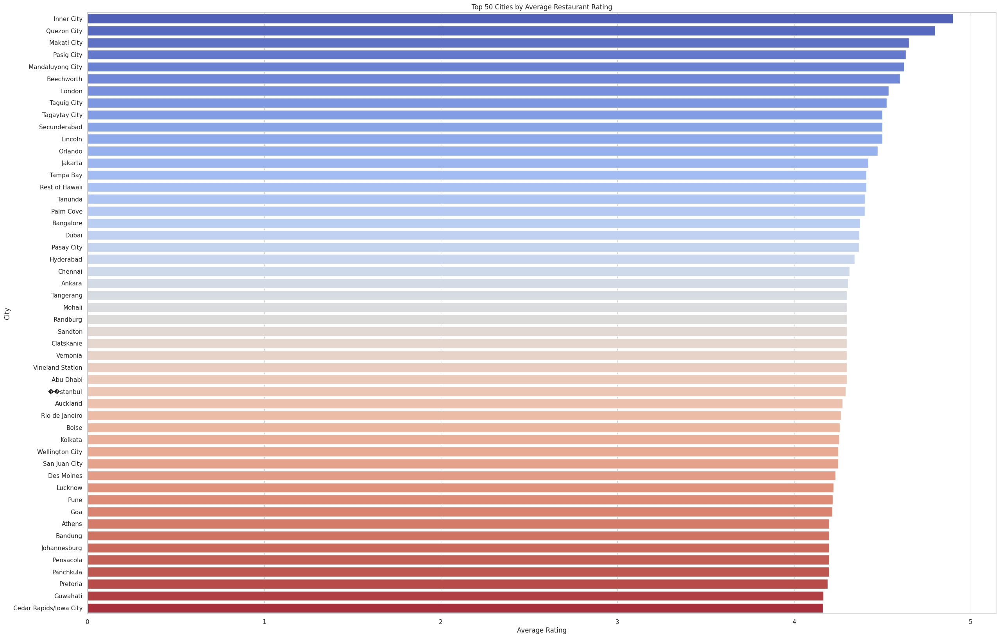

<ipython-input-89-9c2cd085d488>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Average Cost for Two', y='City', data=city_stats.sort_values('Average Cost for Two', ascending=False).head(50), palette='magma')
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.

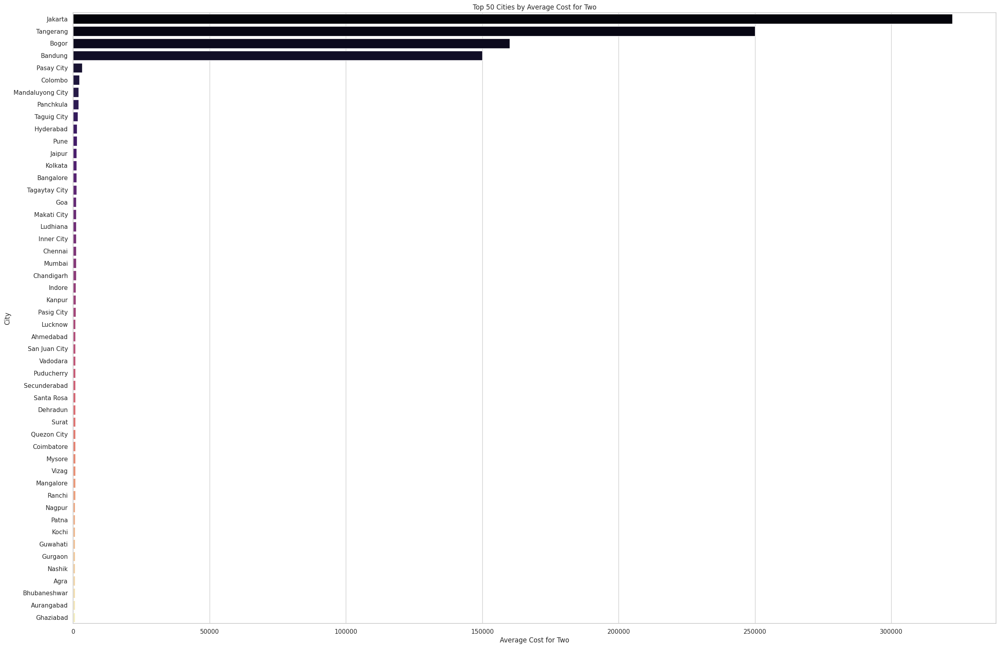

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the plot style
sns.set(style='whitegrid')

# Plot 1: Average Rating per City
plt.figure(figsize=(30, 20))
sns.barplot(x='Average Rating', y='City', data=city_stats.sort_values('Average Rating', ascending=False).head(50), palette='coolwarm')
plt.title('Top 50 Cities by Average Restaurant Rating')
plt.xlabel('Average Rating')
plt.ylabel('City')
plt.show()

# Plot 2: Average Cost for Two per City
plt.figure(figsize=(30, 20))
sns.barplot(x='Average Cost for Two', y='City', data=city_stats.sort_values('Average Cost for Two', ascending=False).head(50), palette='magma')
plt.title('Top 50 Cities by Average Cost for Two')
plt.xlabel('Average Cost for Two')
plt.ylabel('City')
plt.show()


In [ ]:
import folium

# Create a Folium map centered around the mean coordinates of the city stats
mean_lat = city_stats['Latitude'].mean()
mean_lon = city_stats['Longitude'].mean()

# Initialize the map
city_map = folium.Map(location=[mean_lat, mean_lon], zoom_start=6)

# Add circle markers for each city in the city_stats DataFrame
for index, row in city_stats.iterrows():
    folium.CircleMarker(
        location=(row['Latitude'], row['Longitude']),
        radius=row['Average Rating'] * 5,  # Adjust size based on rating
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.6,
        popup=(
            f"<strong>{row['City']}</strong><br>"
            f"Average Rating: {row['Average Rating']:.2f}<br>"
            f"Average Cost for Two: {row['Average Cost for Two']:.2f}"
        )
    ).add_to(city_map)

# Display the map
city_map


### Step 6: Identifying and Visualizing the Most Common Cuisines by City

In this step, we will analyze the dataset to find the most common cuisine for each city. This analysis will help us understand culinary trends in different locations. We will visualize the results using a count plot and a Folium map.

#### Steps:
1. **Find Most Common Cuisines:** Group the data by city and find the mode (most common cuisine) for each city.
2. **Filter Data:** Remove any cities that do not have a common cuisine.
3. **Visualize Cuisines:** Create a count plot to display the distribution of the most common cuisines across cities.
4. **Map Visualization:** Use Folium to plot the cities on a map, indicating the most common cuisine in each city.

Let’s implement these steps and visualize the findings.


In [ ]:
# Group by City and find the most common cuisine, handling cases with no mode
df =df_cleaned.copy()

city_cuisine = df.groupby('City')['Cuisines'].apply(lambda x: x.mode().iloc[0] if not x.mode().empty else None).reset_index()
city_cuisine.columns = ['City', 'Most Common Cuisine']
city_cuisine.head()  # View common cuisines for cities

,City,Most Common Cuisine
0,Abu Dhabi,American
1,Agra,"North Indian, Mughlai"
2,Ahmedabad,"Cafe, American, Continental, Armenian, Fast Food"
3,Albany,"Japanese, Steak, Sushi"
4,Allahabad,"North Indian, Chinese"


<ipython-input-92-61aa1c28609d>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y='Most Common Cuisine', data=city_cuisine_filtered, order=city_cuisine_filtered['Most Common Cuisine'].value_counts().index, palette='Set2')
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/

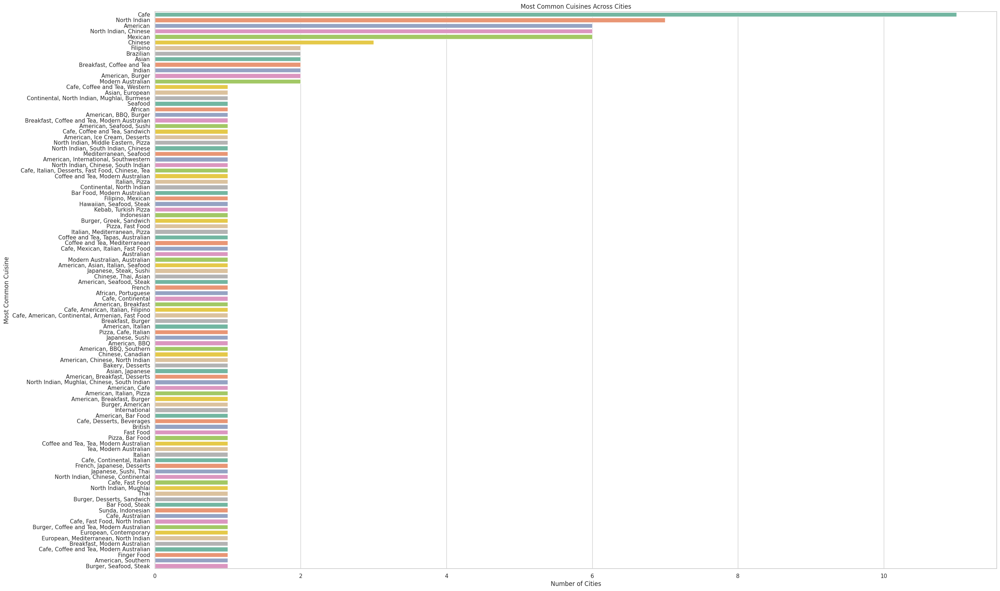

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the plot style
sns.set(style='whitegrid')

# Filter out cities with no common cuisine
city_cuisine_filtered = city_cuisine.dropna()

# Plot: Most Common Cuisine per City
plt.figure(figsize=(30, 20))
sns.countplot(y='Most Common Cuisine', data=city_cuisine_filtered, order=city_cuisine_filtered['Most Common Cuisine'].value_counts().index, palette='Set2')
plt.title('Most Common Cuisines Across Cities')
plt.xlabel('Number of Cities')
plt.ylabel('Most Common Cuisine')
plt.show()


In [ ]:
# Merge city cuisine data with city stats to include latitude and longitude
merged_data = pd.merge(city_cuisine_filtered, city_stats[['City', 'Latitude', 'Longitude']], on='City', how='left')

import folium

# Initialize the map centered around the mean coordinates of the merged data
mean_lat = merged_data['Latitude'].mean()
mean_lon = merged_data['Longitude'].mean()
cuisine_map = folium.Map(location=[mean_lat, mean_lon], zoom_start=6)

# Add markers for each city in the merged data
for index, row in merged_data.iterrows():
    folium.Marker(
        location=(row['Latitude'], row['Longitude']),
        popup=(
            f"<strong>{row['City']}</strong><br>"
            f"Most Common Cuisine: {row['Most Common Cuisine']}"
        ),
        icon=folium.Icon(color='green')  # You can customize the icon color
    ).add_to(cuisine_map)

# Display the map
cuisine_map



In [ ]:
from folium.plugins import HeatMap

df = df_cleaned.copy()

# Prepare data for heatmap
heat_data = [[row['Latitude'], row['Longitude']] for index, row in df.iterrows()]

# Create a heatmap
heatmap = folium.Map(location=[mean_lat, mean_lon], zoom_start=12)
HeatMap(heat_data).add_to(heatmap)

heatmap


### Step 7: Analyzing and Visualizing Top Restaurant Chains

In this step, we will analyze the dataset to count the occurrences of each restaurant name and visualize the top restaurant chains on a map. This analysis will help identify popular restaurant chains and their locations.

#### Steps:
1. **Count Restaurant Occurrences:** Group the data by restaurant name and count how many times each restaurant appears in the dataset.
2. **Filter for Top Chains:** Extract the top 20 restaurant chains based on their counts.
3. **Merge Data:** Merge the top chains with the original DataFrame to retrieve their latitude and longitude for mapping.
4. **Visualize on Map:** Create a Folium map to display the locations of these top restaurant chains, along with the number of visits for each chain.

Let’s implement these steps.

In [ ]:
df_cleaned.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

In [ ]:
# Group by restaurant name and count occurrences

df = df_cleaned.copy()

# Count occurrences of each restaurant name
restaurant_counts = df['Restaurant Name'].value_counts().reset_index()
restaurant_counts.columns = ['Restaurant Name', 'Count']

# Filter for the top restaurant chains (e.g., top 20)
top_chains = restaurant_counts.head(20)

# Merge with original DataFrame to get latitude and longitude for plotting
top_chains_df = df[df['Restaurant Name'].isin(top_chains['Restaurant Name'])]
top_chains_df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
587,18340881,Barbeque Nation,214,Dubai,"G1, Villa, Near HQ Fitness, Near Lulu Mall, Ba...",Barsha 2,"Barsha 2, Dubai",55.215341,25.113380,"Indian, North Indian",...,Emirati Diram(AED),Yes,No,No,No,3,4.5,Dark Green,Excellent,307
613,5600961,Pizza Hut,214,Sharjah,"Next to Safeer Mall, Al Nahda, Sharjah",Al Nahda,"Al Nahda, Sharjah",55.374543,25.305640,"Fast Food, Pizza",...,Emirati Diram(AED),No,No,No,No,3,2.4,Red,Poor,154
641,3400105,Pizza Hut,1,Agra,"8, Handicraft Nagar, Fatehabad Road, Tajganj, ...",Tajganj,"Tajganj, Agra",78.034714,27.161694,"Italian, Pizza",...,Indian Rupees(Rs.),No,No,No,No,2,4.4,Green,Very Good,134
671,2400119,KFC,1,Allahabad,"P Square Mall, Civil Lines, Allahabad",Civil Lines,"Civil Lines, Allahabad",81.839744,25.449659,"American, Fast Food",...,Indian Rupees(Rs.),No,No,No,No,3,3.4,Orange,Average,58
672,2400014,McDonald's,1,Allahabad,"Shop 4, 34-B, M G Marg, Civil Lines, Allahabad",Civil Lines,"Civil Lines, Allahabad",81.834279,25.450329,Fast Food,...,Indian Rupees(Rs.),No,No,No,No,2,3.3,Orange,Average,53
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9220,3200012,Barbeque Nation,1,Vadodara,"3rd Floor, Shreem Shalini Mall, R.C. Dutt Road...",Alkapuri,"Alkapuri, Vadodara",73.170937,22.310526,"Mughlai, North Indian",...,Indian Rupees(Rs.),No,No,No,No,4,4.3,Green,Very Good,332
9234,3200024,Pizza Hut,1,Vadodara,"51,Akashganga Complex,Race Course Road, Vadiwa...",Vadiwadi,"Vadiwadi, Vadodara",73.165081,22.311844,"Pizza, Italian",...,Indian Rupees(Rs.),No,No,No,No,2,4.1,Green,Very Good,269
9256,2800013,Pizza Hut,1,Vizag,"52-1-35,36&38, CMR Mall, New Resapavanipalem, ...","CMR Central Mall, Maddilapalem","CMR Central Mall, Maddilapalem, Vizag",83.318511,17.734178,"Pizza, Fast Food",...,Indian Rupees(Rs.),No,No,No,No,2,4.6,Dark Green,Excellent,289
9257,2800012,Pizza Hut,1,Vizag,"Plot No 47- 10-23/3, 5th Floor, Isnar Khazana ...",Dwaraka Nagar,"Dwaraka Nagar, Vizag",83.305139,17.726147,"Pizza, Fast Food",...,Indian Rupees(Rs.),No,No,No,No,2,4.3,Green,Very Good,230


In [ ]:
import folium

# Calculate mean latitude and longitude for the map's center
mean_lat = top_chains_df['Latitude'].mean()
mean_lon = top_chains_df['Longitude'].mean()

# Create a Folium map centered around the mean latitude and longitude
chain_map = folium.Map(location=[mean_lat, mean_lon], zoom_start=10)

# Add markers for each top restaurant chain
for _, row in top_chains_df.iterrows():
    # Get the restaurant name from the current row
    restaurant_name = row['Restaurant Name']

    # Find the count for this restaurant from the top_chains DataFrame
    count = top_chains[top_chains['Restaurant Name'] == restaurant_name]['Count'].values[0]

    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{restaurant_name} - {count} visits", # Use the retrieved count
        icon=folium.Icon(color='blue')
    ).add_to(chain_map)

# Display the map
chain_map

### Step 8: Analyzing Delivery and Table Booking Options

In this step, we will analyze the total number of restaurants in each city and assess how many offer online delivery and table booking services. We will calculate the percentage of restaurants that provide these options and visualize the results using bar plots and a map.

#### Steps:
1. **Calculate Total Restaurants:** Count the total number of restaurants in each city.
2. **Count Delivery and Table Booking Offers:** Count how many restaurants in each city offer online delivery and table booking.
3. **Calculate Percentages:** Compute the percentage of restaurants offering delivery and table booking.
4. **Visualize Results:** Create bar plots to display the percentages and a map to visualize delivery options across cities.

Let's implement these steps.

In [ ]:
# Create a copy of the cleaned DataFrame
df_status = df_cleaned.copy()

# Calculate total restaurants and those offering online delivery and table booking by city
city_delivery_status = df_status.groupby('City').agg(
    Total_Restaurants=('Restaurant ID', 'count'),
    Delivery_Offering=('Has Online delivery', lambda x: (x == 'Yes').sum()),
    Table_Booking_Offering=('Has Table booking', lambda x: (x == 'Yes').sum())
).reset_index()

# Calculate the percentage of restaurants offering delivery and table booking
city_delivery_status['Delivery_Percentage'] = (city_delivery_status['Delivery_Offering'] / city_delivery_status['Total_Restaurants']) * 100
city_delivery_status['Table_Booking_Percentage'] = (city_delivery_status['Table_Booking_Offering'] / city_delivery_status['Total_Restaurants']) * 100

# Display the results
city_delivery_status.head()


,City,Total_Restaurants,Delivery_Offering,Table_Booking_Offering,Delivery_Percentage,Table_Booking_Percentage
0,Abu Dhabi,20,11,6,55.000000,30.0
1,Agra,10,0,0,0.000000,0.0
2,Ahmedabad,21,11,0,52.380952,0.0
3,Albany,20,0,0,0.000000,0.0
4,Allahabad,15,0,0,0.000000,0.0


<ipython-input-107-94789e68d9f1>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Delivery_Percentage', y='City', data=city_delivery_status.sort_values('Delivery_Percentage', ascending=False), palette='Blues', ax=axs[0])
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/l

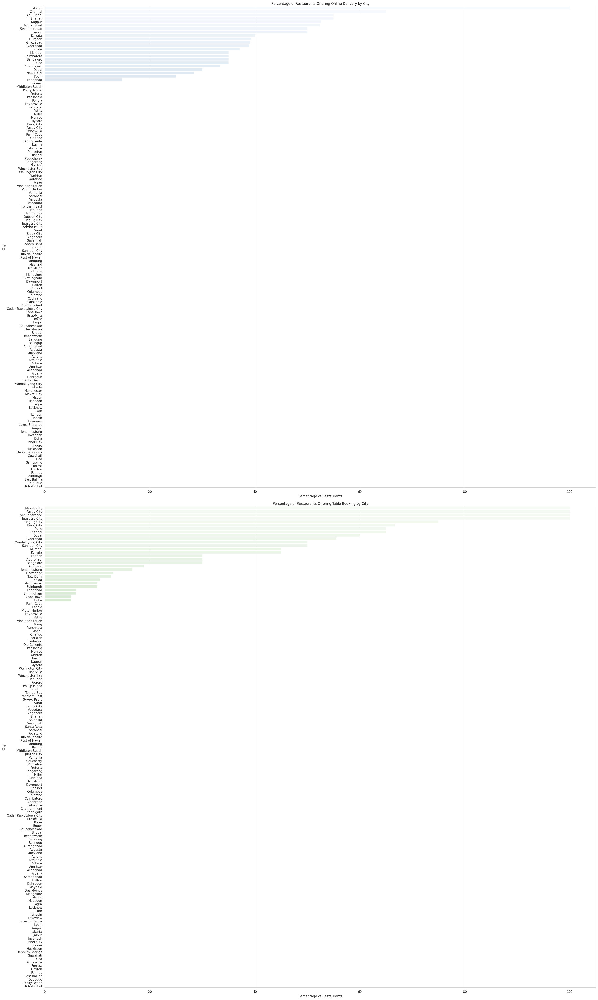

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the plot style
sns.set(style='whitegrid')

# Create a figure with two subplots
fig, axs = plt.subplots(2, 1, figsize=(30, 50))

# Plot 1: Delivery Percentage per City
sns.barplot(x='Delivery_Percentage', y='City', data=city_delivery_status.sort_values('Delivery_Percentage', ascending=False), palette='Blues', ax=axs[0])
axs[0].set_title('Percentage of Restaurants Offering Online Delivery by City')
axs[0].set_xlabel('Percentage of Restaurants')
axs[0].set_ylabel('City')

# Plot 2: Table Booking Percentage per City
sns.barplot(x='Table_Booking_Percentage', y='City', data=city_delivery_status.sort_values('Table_Booking_Percentage', ascending=False), palette='Greens', ax=axs[1])
axs[1].set_title('Percentage of Restaurants Offering Table Booking by City')
axs[1].set_xlabel('Percentage of Restaurants')
axs[1].set_ylabel('City')

# Adjust layout
plt.tight_layout()
plt.show()


In [ ]:
import folium

# Create a Folium map centered on the average latitude and longitude of the cities
mean_lat = df_status['Latitude'].mean()
mean_lon = df_status['Longitude'].mean()

status_map = folium.Map(location=[mean_lat, mean_lon], zoom_start=10)

# Add circles for each city representing the delivery percentage
for _, row in city_delivery_status.iterrows():
    folium.CircleMarker(
        location=[df_status[df_status['City'] == row['City']]['Latitude'].mean(),
                  df_status[df_status['City'] == row['City']]['Longitude'].mean()],
        radius=row['Delivery_Percentage'] / 5,  # Scale for visibility
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.5,
        popup=f"{row['City']} - Delivery: {row['Delivery_Percentage']:.1f}%<br>Table Booking: {row['Table_Booking_Percentage']:.1f}%"
    ).add_to(status_map)

# Display the map
status_map


## Step 9: Clustering Restaurants with K-Means

In this step, we will perform clustering on the restaurant data using the K-Means algorithm. The goal is to group restaurants based on their geographical coordinates, average cost for two, and aggregate rating. This will help us identify patterns and similarities among different restaurants.

### Steps Involved:

1. **Import Libraries**: We begin by importing the necessary libraries, including `pandas`, `StandardScaler` from `sklearn`, `KMeans`, and `folium` for visualization.

2. **Copy DataFrame**: We create a copy of the cleaned DataFrame (`df_cleaned`) to work with.

3. **Select Relevant Features**: We choose the features that will be used for clustering: latitude, longitude, average cost for two, and aggregate rating.

4. **Standardize Features**: The selected features are standardized using `StandardScaler` to ensure they are on a similar scale, which is crucial for effective clustering.

5. **Determine Optimal Clusters**: We use the elbow method to determine the optimal number of clusters. By plotting the inertia (the sum of squared distances from each point to its assigned cluster center) against the number of clusters, we can visually identify the point where adding more clusters does not significantly decrease inertia.

6. **Fit K-Means**: Once we determine the appropriate number of clusters (let's say `k=5`), we fit the K-Means algorithm to the scaled features and assign each restaurant a cluster label.

7. **Visualize Clusters on Map**: We create a base map using `folium` and add circle markers for each restaurant, color-coded based on the cluster to which they belong. This visual representation helps us easily identify clusters geographically.


In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
df = df_cleaned.copy()
# Assuming df_cleaned is your DataFrame
# Selecting relevant features for clustering
features = df[['Latitude', 'Longitude', 'Average Cost for two', 'Aggregate rating']]

# Standardizing the features
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Convert back to DataFrame for easier manipulation
features_scaled_df = pd.DataFrame(features_scaled, columns=features.columns)


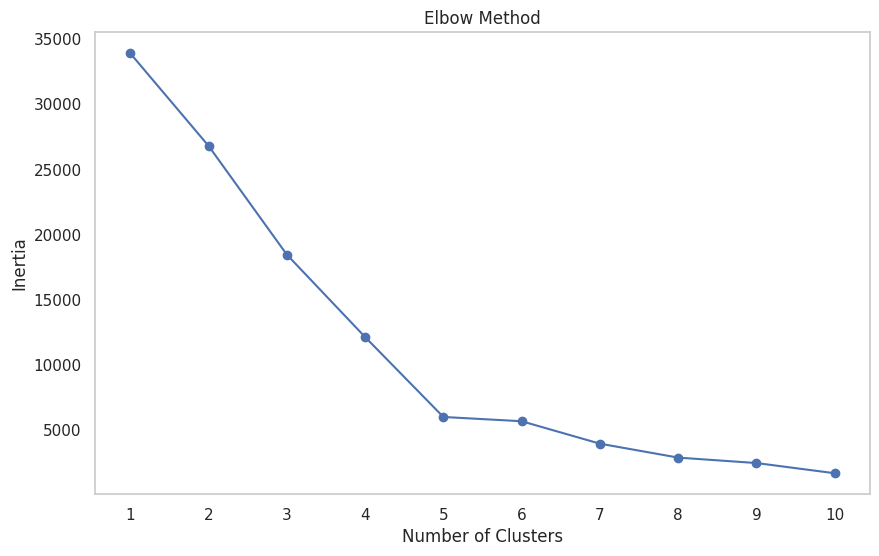

In [ ]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Determine the optimal number of clusters
inertia = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(features_scaled_df)
    inertia.append(kmeans.inertia_)

# Plotting the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.xticks(range(1, 11))
plt.grid()
plt.show()


In [ ]:
# Fit K-Means with the chosen number of clusters
k = 5  # Replace with your chosen number of clusters
kmeans = KMeans(n_clusters=k, random_state=42)
df['Cluster'] = kmeans.fit_predict(features_scaled_df)


In [ ]:
import folium

# Create a base map
base_map = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=10)

# Add clusters to the map
for idx, row in df.iterrows():
    folium.CircleMarker(
        location=(row['Latitude'], row['Longitude']),
        radius=5,
        color=plt.cm.tab10(row['Cluster'] % 10),  # Using a colormap for different clusters
        fill=True,
        fill_opacity=0.7,
        popup=row['Restaurant Name']
    ).add_to(base_map)

# Display the map
base_map


## Conclusion

In this analysis, we explored the restaurant dataset by performing several key steps that provided valuable insights into restaurant distribution, services offered, and clustering patterns.

1. **Data Cleaning**: We started by cleaning the dataset to ensure its quality, removing any duplicates and handling missing values. This step laid a solid foundation for further analysis.

2. **Visualizing Top Restaurant Chains**: By identifying the top restaurant chains and visualizing their locations on a map, we gained insights into their geographical distribution, which can inform marketing strategies and business decisions.

3. **Delivery and Table Booking Analysis**: We analyzed the delivery and table booking offerings across different cities, providing a clearer picture of customer service options available to diners. The visualizations highlighted the percentage of restaurants offering these services, enabling stakeholders to identify opportunities for improvement.

4. **Clustering Analysis**: Utilizing K-Means clustering, we grouped restaurants based on geographic and operational features. The elbow method helped us determine the optimal number of clusters, allowing us to visualize the spatial distribution of restaurant types. This clustering can assist in identifying market trends and tailoring strategies for specific areas.

### Final Thoughts

This comprehensive analysis not only provides a deeper understanding of the restaurant landscape but also serves as a guide for stakeholders looking to enhance their business operations. Future work could involve incorporating customer feedback, analyzing trends over time, or examining additional features to further refine our understanding of restaurant dynamics. Overall, this analysis equips stakeholders with actionable insights to make informed decisions in a competitive market.
